<a href="https://colab.research.google.com/github/OSGeoLabBp/tutorials/blob/master/hungarian/pointcloud/pc_classification_with_mlp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pontfelhő osztályozás többrétegú neurális hálózat (Multi-Layer Percetron) segítségével

# 1.) Pontfelhő osztályozás gépi tanulás segítségével

###Gépi tanulás vs. mély tanulás

**Mesterséges intelligencián** (AI) belül megkülönböztethetünk **gépi tanuláson** (ML), és **mély tanuláson** (DL) alapuló módszereket.

A **gépi tanulás** az AI egy részhalamza. A gépi tanuláson alapuló algoritmusok alapvetően az adathalamazokban valamilyen tulajdonság (attribútum) alapján összefüggéseket, mintázatokat keresnek, ismernek fel. Annak függvényében, hogy a minták felismerése, illetve a csoportok elkülönítése milyen módon történik megkülönböztetünk:

- *felügyelt*,
- *felügyelet nélküli*,
- *megerősített*

gépi tanulási módszereket.

A **mély tanulás** a gépi tanulási módszerek egy részhalamzába tartozik. Elsősorban egymásba ágyazott neuronhálózatok alkalmazásán alapszik. Az utóbbi időkben rohamosan fejlődő videókártyák növekvő számítási kapacitása tette lehetővé mély tanuláson alapuló a módszereknek az elterjedését.

![](https://learn.microsoft.com/hu-hu/azure/machine-learning/media/concept-deep-learning-vs-machine-learning/ai-vs-machine-learning-vs-deep-learning.png?view=azureml-api-2)




Alapvetően a gépi tanuláson és mély tanuláson alapuló módszerek között a fő különbség a következő táblázat mutatja be:


Szempontok | Gépi tanulás | Mély tanulás
 --- | --- | ----
 Adatok száma | Kisebb mennyiségű adattal operál | Nagy mennyiségű adattal operál
 Hardverigény | Nincs szükség nagy számítási kapacitásra | Nagy számítási kapacitás szükséges, elsősorban GPU
 Jellemzők (feature) meghatározása szempontjából | Felhasználónak kell kiválasztani, előkészíteni, meghatározni | Halózat magának választja ki
  Tanítás ideje | Viszonylag kevés időt vesz igénybe | Általában hosszú időt vesz igénybe
 Kimenet | A kimenet általában numerikus érték, pl.: pontszám vagy besorolás | A kimenet több formátumot is tartalmazhat, pl.: szöveget, pontszámot vagy hangot



![](https://github.com/OSGeoLabBp/tutorials/blob/master/hungarian/machine_learning/images/ml_vs_dl.jpg?raw=true)


### Gépi tanulás és pontfelhők

A pontfelhők esetében megkülönböztetünk geometria, spektrális és sajátértékeken alapuló jellemzőket. A geometriai jellemzők lehetnek az egyes koordináták, lokális pontsűrűség, különböző görbület értékek. Spektrális jellemzőkhöz elsősorban a különböző szín, intenzitás adatok tartozhatnak. Léteznek úgynevezett sajátértéken alapuló pontfelhő jellemzők is.

A pontfelhő egy pontjának sajátértékei ($\lambda_1$, $\lambda_2$ és $\lambda_3$) a $Q$ mátrix sajátértékei, amely a következő képlettel számítható ki:

![](https://github.com/OSGeoLabBp/tutorials/blob/master/hungarian/machine_learning/images/kovmtx.png?raw=true)

Ahol $A$ mátrix tartalmazza az adott pont $R$ sugarú környezetében található pontok koordinátáit, a súlypont koordinátáival történő eltolása után:

![](https://github.com/OSGeoLabBp/tutorials/blob/master/hungarian/machine_learning/images/amtx.png?raw=true)

Ezek a sajátértékek értékes információt tartalmazhatnak az adott pont és környezetébe eső pontok által alkotott ponthalmaz geometriájáról és ezekből további jellemzők vezethetőek le:

![](https://github.com/OSGeoLabBp/tutorials/blob/master/hungarian/machine_learning/images/sajatertekek.png?raw=true)

Pontfelhők esetében a különböző gépi tanuláson alapuló algoritmusok a sajátértékekből és az ezekből levezethető egyéb tulajdonságokból indulhatnak ki.

A következőkben egy gyakorlati példán keresztül nézzük meg, hogyan használhatók fel a manuálisan meghatározott pontfelhő jellemző tető és növényzet osztályozásra egy többrétegő neurális hálózat segítségével.

## 2.) Előkészítés

### a.) Tanító adatok letöltése és megjelenítése

Kezdésként töltsük le a tanításhoz előkészített adatokat a következő Google Drive link segítségével:

In [36]:
!gdown -q --folder https://drive.google.com/drive/folders/1-45EpDnzt-sydtn9H7Q6-kT6yHnYEuQZ?usp=sharing -O PC_Classes

A letöltött mappa manuálisan szegmentált pontfelhőket tartalmaz osztályok szerint almappákba rendezve.
Definiáljuk az egyes elérési útvonalhoz, mappákhoz tartozó válozókat:


In [37]:
DATADIR = './PC_Classes'
CATEGORIES = ['Wires','Other']

A letöltőtt pontfelhőkben már megtalálhatjuk az egyes pontokhoz, különböző sugárértékekkel kiszámított  [jellemzőket (geometric features)](https://www.cloudcompare.org/doc/wiki/index.php/Compute_geometric_features). A számításhoz készíthetünk saját programot is, de használhatjuk a [CloudCompare](https://www.danielgm.net/cc/) nyílt forráskodú szofverben megtalálható funckiókat is.  A szoftver segítségével hamis színes megjelenítéssel is vizualizálhatjuk a meghatározott jellemzőket, illetve exportálhatjuk számított értékeket .LAS formátumú pontfelhőként is.

Amennyiben python segítségével szeretnénk megoldani a feladatot, akár használhatunk a [jakteristics](https://github.com/jakarto3d/jakteristics) könyvtárati is.

Vizsgáljuk meg, hogy a letöltőtt pontfelhőkben ez hogyan jelennek meg ezek az értékek. A LAS formátumú pontfelhők kezelésére a laspy modult fogjuk használni. Ezt először telepítenünk kell.

In [38]:
import numpy as np
!pip install -q laspy
import laspy
import os

def read_las_file_scalarfields(file_path):
  ''' Pontfelhőben található skalármezők mentése egy listába '''
  las = laspy.read(file_path)
  fields = list(las.point_format.extra_dimension_names)
  print("Scalar fields:")
  for field in fields:
      print(field)
  return fields

A következőkben írassuk ki egy függény segítségével valamelyik fájlban fellelhető skalármezőket:

In [39]:
category_path = os.path.join(DATADIR, CATEGORIES[0])
first_file_in_category = os.listdir(category_path)[0]
custom_extra_dim_names = read_las_file_scalarfields(os.path.join(category_path, first_file_in_category))

Scalar fields:
Eigenvalues sum (2.5)
Omnivariance (2.5)
Eigenentropy (2.5)
Anisotropy (2.5)
Planarity (2.5)
Linearity (2.5)
PCA1 (2.5)
PCA2 (2.5)
Surface variation (2.5)
Sphericity (2.5)
Verticality (2.5)
1st eigenvalue (2.5)
2nd eigenvalue (2.5)
3rd eigenvalue (2.5)
Number of neighbors (r=2.5)
Surface density (r=2.5)
Volume density (r=2.5)
Gaussian curvature (2.5)
Normal change rate (2.5)
Eigenvalues sum (1)
Omnivariance (1)
Eigenentropy (1)
Anisotropy (1)
Planarity (1)
Linearity (1)
PCA1 (1)
PCA2 (1)
Surface variation (1)
Sphericity (1)
Verticality (1)
1st eigenvalue (1)
2nd eigenvalue (1)
3rd eigenvalue (1)
Number of neighbors (r=1)
Surface density (r=1)
Volume density (r=1)
Gaussian curvature (1)
Normal change rate (1)
Eigenvalues sum (0.5)
Omnivariance (0.5)
Eigenentropy (0.5)
Anisotropy (0.5)
Planarity (0.5)
Linearity (0.5)
PCA1 (0.5)
PCA2 (0.5)
Surface variation (0.5)
Sphericity (0.5)
Verticality (0.5)
1st eigenvalue (0.5)
2nd eigenvalue (0.5)
3rd eigenvalue (0.5)
Number of neig

A CloudCompare az exportálásnál a skalármező neve alapján tárolja a különböző értékeket. Az előkészítés során nekünk az egyes skalármezők adatait ki kell majd keresnünk, emiatt érdemes a keresendő értékek neveit tartalmazó listát létrehoznunk:

In [40]:
custom_extra_dim_names = ['Omnivariance (0.25)',
                          'Anisotropy (0.25)',
                          'Planarity (0.25)',
                          'Sphericity (0.25)',
                          'Linearity (0.25)',
                          'Omnivariance (0.5)',
                          'Anisotropy (0.5)',
                          'Planarity (0.5)',
                          'Sphericity (0.5)',
                          'Linearity (0.5)',
                          'Omnivariance (1)',
                          'Anisotropy (1)',
                          'Planarity (1)',
                          'Sphericity (1)',
                          'Linearity (1)'
                          ]

### b.) Adatok előkészítése a tanításhoz

A tanításhoz használható jellemzők megismérése és kiválasztása után kezdjük el előkészíteni az adatokat a tanításhoz.

In [41]:
!pip install -q open3d
import open3d as o3d
import numpy as np
import os
import shutil

Telepítés után a következő függvény segítségével olvassuk be az adatokat egy Numpy tömbbe!

In [42]:
def pc_features2np(pc_las_fnm, custom_extra_dim_names):
    ''' Pontfelhő beolvasása jellemzőkkel egy numpy tömbbe.
        Paraméterek:
                    pc_las_fnm (str): fájlnév
                    custom_extra_dim_names (lista stringekkel): a kiválasztott értékek listája
        Eredmény:
                    numpy tömb a kiválasztott értékekkel
    '''
    # Pontfelhő beolvasása
    las = laspy.read(pc_las_fnm)
    extra_dim_lst = list(las.point_format.extra_dimension_names)

    # Kiválasztott jellemzők beolvasása numpy tömbbe
    pc_xyz_features = []
    list_of_features = ['x', 'y', 'z', 'r', 'g', 'b']

    for extra_dim in custom_extra_dim_names:
        if len(pc_xyz_features) == 0:
            id = [n for n, x in enumerate(extra_dim_lst) if extra_dim in x]
            pc_xyz_features = las[extra_dim_lst[id[0]]].reshape(-1,1)
        else:
            id = [n for n, x in enumerate(extra_dim_lst) if extra_dim in x]
            col = las[extra_dim_lst[id[0]]].reshape(-1,1)
            pc_xyz_features = np.concatenate([pc_xyz_features, col], axis=1)

    # XYZ és színadatok gyűjtése
    xyz = las.xyz.reshape((-1,3))
    r = (las.red // 256).astype(np.uint8).reshape((-1,1))
    g = (las.green // 256).astype(np.uint8).reshape((-1,1))
    b = (las.blue // 256).astype(np.uint8).reshape((-1,1))
    colors = np.concatenate([r, g, b], axis=1).reshape(-1,3)

    # Adatok összefűzése egy tömbbe
    if len(pc_xyz_features) == 0:
        pc_xyz_colors_features = np.concatenate([xyz, colors], axis=1)
    else:
        pc_xyz_colors_features = np.concatenate([xyz, colors, pc_xyz_features], axis=1)

    # Ellenőrzés, hogy nincs-e None adat
    pc_xyz_colors_features_filt = (pc_xyz_colors_features[~np.isnan(pc_xyz_colors_features).any(axis=1), :])

    return pc_xyz_colors_features_filt


Osztályok számának függvényében adjunk címkéket is a beolvasott adatokhoz!

In [43]:
# Az X_features és y_labels létrehozása tanítási adatokkal és címkékkel
X_features = []
y_labels = []

# A kategóriák mentén iterálás
for category in CATEGORIES:
    # A kategóriához tartozó elérési út összeállítása
    path = os.path.join(DATADIR, category)
    # Az osztály számának meghatározása
    class_num = CATEGORIES.index(category)
    # A fájlokon belüli iteráció
    for pc in os.listdir(path):

        # Ha még nem töltöttük fel az X_features és y_labels listákat
        if len(X_features) == 0:
            X_features = pc_features2np(os.path.join(path, pc), custom_extra_dim_names)
            y_labels = np.full(X_features.shape[0], class_num)

        else:
            # Jellemzők és címkék hozzáadása az X_features és y_labels listákhoz
            features = pc_features2np(os.path.join(path, pc), custom_extra_dim_names)
            labels = np.full(features.shape[0], class_num)
            X_features = np.concatenate((X_features, features), axis=0)
            y_labels = np.concatenate((y_labels, labels), axis=0)

# Teszt mérete - azonosnak kell lennie
print("Beolvasott pontok száma:", X_features.shape[0])
print("Az egyes pontokhoz tartozó jellemzők száma:", X_features.shape[1])

Beolvasott pontok száma: 67548
Az egyes pontokhoz tartozó jellemzők száma: 21


Ellenőrzésként írassuk ki az egyes elemek számát címkénként:

In [44]:
unique_labels, unique_label_counts = np.unique(y_labels, return_counts=True)
for label, count in zip(unique_labels, unique_label_counts):
    print(f'Az {label}-s címkéhez tartozó elemek száma: {count}')

Az 0-s címkéhez tartozó elemek száma: 8959
Az 1-s címkéhez tartozó elemek száma: 58589


A tanítás hatékonysága érdekében érdemes normalizálni az adatokat. Erre számos lehetpságet kínál fől a scikit-learn könyvtár. A munkafüzetben mi a MinMaxScaler függvényény segítségével alakíjuk át az egyes jellemzőket a 0 és 1 közötti értékekre.

Az normalizálás előtt a pontok eredeti koordinátáit válasszuk le a jellemzőktől:

In [45]:
from sklearn.preprocessing import MinMaxScaler

# Adatok szétválasztása
xyz_X_features = X_features[:,0:3]
#colors_X_features = X_features[:,3:6]

# Normalizálás
scaler = MinMaxScaler()

# Normalizált jellemzők tárolása
X_features_scaled = scaler.fit_transform(X_features[:,3:X_features.shape[1]])


Normalizálás után egyesítjük az tömböket:

In [46]:
X_features_scaled = np.concatenate((xyz_X_features[:,0:3],X_features_scaled),axis=1)

# Tömb méretének kiíratása ellenőrzéshez
print(np.shape(X_features_scaled))

(67548, 21)


A beolvasott adatokat válasszuk szét tanító (train) teszt (test) adatokra. A tanításhoz a beolvasott adatok 70% használjuk majd fel.

In [47]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
     X_features_scaled, y_labels, test_size=0.3, shuffle=True)

Érdemes validáló (validation) adatokat is használni, amik az esetleges túl- és alultanítások feltárásában segíthetnek nekünk. Jelen esetben ez a teszt adatok harmada lesz majd.

Így összeségében példánkban a beolvasott adatok 70% tanító, 20% teszt és 10% validáló adat lesz majd.

In [48]:
X_test, X_valid, y_test, y_valid = train_test_split(
     X_test, y_test, test_size=0.33, shuffle=True)

## 3.) Multi-Layer Perceptron modell előállítása és tanítása

![](https://github.com/OSGeoLabBp/tutorials/blob/master/hungarian/machine_learning/images/ml_mlp.png?raw=true)

A modell tanítására a keras modult fogjuk felhasználni.

In [49]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
import pickle

import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import itertools

Adjuk meg, hogy milyen névvel szeretnénk menteni, illetve hány epocháig szeretnénk tanítani a modellt!


In [50]:
model_filename = 'mlp_model.pickle'
epochs = 25 # 1000 epocháig tesztelve, elegendő 50

Hozzuk létre a többrétegű neurális hálónkat a keras segítségével, majd indítsuk el a tanítást. Ez eltarthat néhány percig...

Addig is van időnk tanulmányozni a beállított paramétereket!

In [51]:
X_train.shape[1]

21

In [52]:
# Modell meghatározása
num_classes = len(CATEGORIES) # osztályok száma = kimenetei réteg

# Többrétegű neurális háló előállítása az bemenő jellemzők száma, illetve osztályok száma alappján
mlp_model = Sequential()
mlp_model.add(Dense(32, activation='relu', input_dim=X_train.shape[1]-3))
mlp_model.add(Dense(16, activation='relu'))
mlp_model.add(Dense(num_classes, activation='softmax')) # a két osztály esetén lehetne sigmoidot is használni, a softmax "n" db osztálynál is működik
                                                        # Softmax kimenet esetén a legmagasabb valószínűségű osztály indexének visszaadása
# Modell összeállítása
mlp_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Modell tanítása
mlp_model.fit(X_train[:, 3:], y_train, batch_size=1024, epochs=epochs, validation_data=(X_valid[:, 3:], y_valid), verbose=2)  # Az epochokat igény szerint állíthatja

# Modell mentése pickle segítségével
with open(model_filename, 'wb') as f:
    pickle.dump(mlp_model, f)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:106: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/25
47/47 - 7s - 151ms/step - accuracy: 0.8673 - loss: 0.3727 - val_accuracy: 0.8708 - val_loss: 0.2482
Epoch 2/25
47/47 - 1s - 15ms/step - accuracy: 0.8800 - loss: 0.1914 - val_accuracy: 0.9359 - val_loss: 0.1366
Epoch 3/25
47/47 - 1s - 11ms/step - accuracy: 0.9696 - loss: 0.1163 - val_accuracy: 0.9824 - val_loss: 0.0938
Epoch 4/25
47/47 - 0s - 10ms/step - accuracy: 0.9850 - loss: 0.0829 - val_accuracy: 0.9865 - val_loss: 0.0680
Epoch 5/25
47/47 - 1s - 14ms/step - accuracy: 0.9865 - loss: 0.0611 - val_accuracy: 0.9871 - val_loss: 0.0525
Epoch 6/25
47/47 - 0s - 10ms/step - accuracy: 0.9870 - loss: 0.0492 - val_accuracy: 0.9870 - val_loss: 0.0449
Epoch 7/25
47/47 - 1s - 11ms/step - accuracy: 0.9876 - loss: 0.0432 - val_accuracy: 0.9873 - val_loss: 0.0407
Epoch 8/25
47/47 - 1s - 14ms/step - accuracy: 0.9880 - loss: 0.0397 - val_accuracy: 0.9865 - val_loss: 0.0386
Epoch 9/25
47/47 - 1s - 12ms/step - accuracy: 0.9880 - loss: 0.0376 - val_accuracy: 0.9874 - val_loss: 0.0364
Epoch 10/

Vizsgáljuk meg a végleges modell felépítését!

In [53]:
mlp_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 32)             │           608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 2)              │            34 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,512 (13.72 KB)

 Trainable params: 1,170 (4.57 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,342 (9.15 KB)

Ábrázoljuk a tanítás folyamatát!

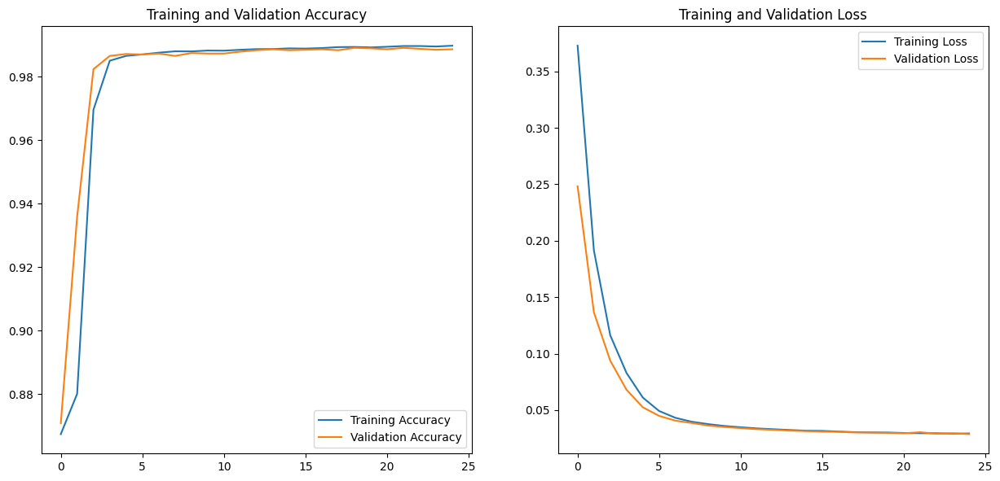

In [54]:
acc = mlp_model.history.history['accuracy']
val_acc = mlp_model.history.history['val_accuracy']
loss = mlp_model.history.history['loss']
val_loss = mlp_model.history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(15, 15))
plt.subplot(2, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Vizsgáljuk meg, hogy az egyes jellemzők mennyire fontosak a tanítás során!

In [55]:
from sklearn.inspection import permutation_importance
from sklearn.base import BaseEstimator # scikit-learn kompatibilitásához
import pandas as pd

# Keras és scikit-learn kompatibilitáshoz
class KerasEstimator(BaseEstimator):
    def __init__(self, model):
        self.model = model

    def fit(self, X, y=None):
        return self

    def predict(self, X):
        preds = self.model.predict(X)
        return np.argmax(preds, axis=1)

    def score(self, X, y):
        return np.mean(self.predict(X) == y)

# A jellemzők neveinek listája (RGB + a használt jellemzők)
feature_names = ['Red', 'Green', 'Blue'] + custom_extra_dim_names

# Létrehozunk egy KerasEstimator példányt a betanított MLP modellünkből
wrapper = KerasEstimator(mlp_model)

# A fontosság kiszámítása
result = permutation_importance(
    wrapper, # A modell
    X_test[:, 3:], # Teszt adatok jellemzői
    y_test, # Adatokhoz tartozó valódi címkék
    n_repeats=10,
    random_state=42,
    scoring='accuracy' # Az értékelési mód --> pontosság csökkenését vizsgáljuk
)

# Az eredmények kigyűjtése
importance = pd.Series(result.importances_mean, index=feature_names)
importance = importance.sort_values(ascending=False)
print(importance)

425/425 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
425/425 ━━━━━━━━

Jelenítsük meg az értékeket oszlopdiagramokkal ábrázolva:

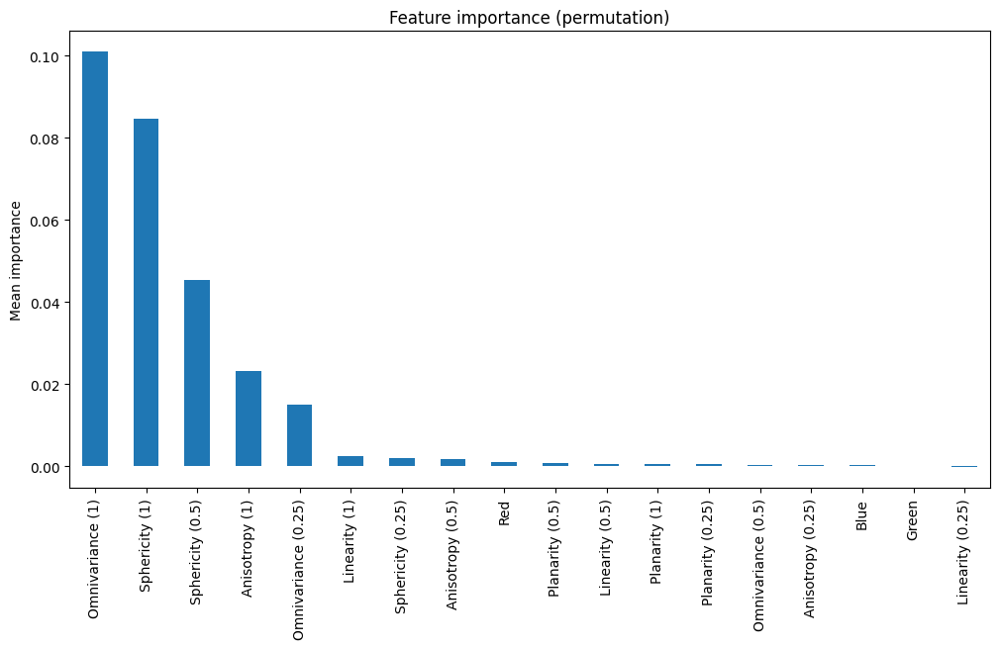

In [56]:
importance.plot(kind='bar', figsize=(12,6), title='Feature importance (permutation)')
plt.ylabel('Mean importance')
plt.show()

A teszt adatok felhasználásával jelenítsünk meg pár metrikát!

In [57]:
# Pontossági érték kiszámítása és kiíratása
y_mlp_predictions = mlp_model.predict(X_test[:,3:X_test.shape[1]])

# Softmax esetén a legnagyobb valószínűségű osztály indexét választjuk
y_mlp_predictions = np.argmax(y_mlp_predictions, axis=1)

print('Modell pontossága: {0:0.4f}'. format(accuracy_score(y_test, y_mlp_predictions)))
print("Pontosság a teszt adatokon \n",classification_report(y_test,y_mlp_predictions, target_names = CATEGORIES))


425/425 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Modell pontossága: 0.9898
Pontosság a teszt adatokon 
               precision    recall  f1-score   support

       Wires       0.95      0.97      0.96      1822
       Other       1.00      0.99      0.99     11755

    accuracy                           0.99     13577
   macro avg       0.97      0.98      0.98     13577
weighted avg       0.99      0.99      0.99     13577



Jelenítsük meg a zavar mátrixot!

In [58]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Zavarmátrix számítása
cm = confusion_matrix(y_test, y_mlp_predictions)

Megjelenítéshez használhatjuk a következő függényt is.

In [59]:
def plot_confusion_matrix(cm, target_names=None, cmap=None, normalize=True, labels=True, title='Confusion matrix'):
    '''
    A függvény segít ábrázolni a tévesztési mátrixot.
    '''
    # Pontosság és hibás osztályozás kiszámítása
    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy
    # Alapértelmezett színskála beállítása
    if cmap is None:
        cmap = plt.get_cmap('Blues')
    # Normalizálás
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    # Megjelenítés
    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    # Címkék beállítása, ha elérhető
    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names)
        plt.yticks(tick_marks, target_names)
    # Számok hozzáadása a cellákhoz
    if labels:
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            if normalize:
                plt.text(j, i, "{:0.1%}".format(cm[i, j]),
                         horizontalalignment="center",
                         color="white" if cm[i, j] > thresh else "black")
            else:
                plt.text(j, i, "{:,3}".format(cm[i, j]),
                         horizontalalignment="center",
                         color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\nAccuracy={:0.1%}; Misclass={:0.1%}'.format(accuracy, misclass))
    plt.show()

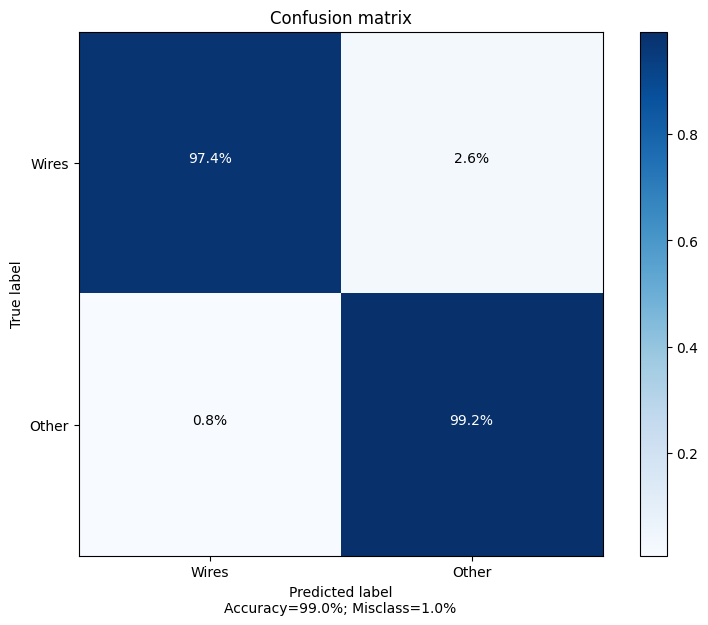

In [60]:
cm_display2 = plot_confusion_matrix(cm, target_names=CATEGORIES)

## 4.) Használjuk fel az MLP modellt egy nagyobb pontfelhőn!

Töltsük le a pontfelhőt!

In [61]:
# Letöltött pontfelhő jellemzőkkel
pc_fnm = 'GITA_test_pointcloud_features.las'
# Létrehozott modell
model_filename = 'mlp_model.pickle'
# Mappa ahova mentse majd az eredményeket
new_folder = pc_fnm[:-4] + '_predicted_classes'

Előkészítés

In [62]:
pc2np = pc_features2np(os.path.join(DATADIR,pc_fnm), custom_extra_dim_names)
X_features = pc2np[:,3:pc2np.shape[1]]
X_features = MinMaxScaler().fit_transform(X_features)

Ellenőrzésként írassuk ki a jellemzők, pontok számát:

In [63]:
print(np.shape(X_features))

(373434, 18)


Modell betöltése és alkalmazása

In [64]:
model = pickle.load(open(model_filename, 'rb'))
y_predict = model.predict(X_features)

# softmax esetén a legnagyobb valószínűségű osztály indexét választjuk
y_predict = np.argmax(y_predict, axis=1)

11670/11670 ━━━━━━━━━━━━━━━━━━━━ 21s 2ms/step


Eredmények kiíratása és exportálása

In [65]:
# Változók definiálása exportáláshoz
xyz = pc2np[:,0:3]
colors = pc2np[:,3:6]
classes = np.unique(y_predict)
labels = y_predict

# A pontok száma osztályonként
unique_labels, unique_label_counts = np.unique(y_predict, return_counts=True)
for label, count in zip(unique_labels, unique_label_counts):
    print(f'Az {label}-s osztályba tartozó elemek száma: {count}')

# Mappa létrehozása az exportáláshoz
if os.path.isdir(new_folder):
    shutil.rmtree(new_folder, ignore_errors=True)
    os.mkdir(new_folder)
else:
    os.mkdir(new_folder)

# Pontfelhők mentése osztályonként
for class_n in classes:
    row_ix = np.where(labels == class_n)
    xyz_class = xyz[row_ix[0],:]
    color_class = colors[row_ix[0],:]
    pc_class = o3d.geometry.PointCloud()
    pc_class.points = o3d.utility.Vector3dVector(xyz_class)
    pc_class.colors = o3d.utility.Vector3dVector(color_class/255)
    if class_n >= 0:
        if not o3d.io.write_point_cloud(os.path.join(new_folder, f'class_{str(class_n)}.ply'), pc_class):  # Export ply
            print('Failed to save cluster {class_n}')
    else:
        if not o3d.io.write_point_cloud(os.path.join(new_folder, 'noise.ply'), pc_class): # export noise
            print('Failed to save cluster {class_n}')

Az 0-s osztályba tartozó elemek száma: 50747
Az 1-s osztályba tartozó elemek száma: 322687


Készítsünk egy interaktív megjelenítőt az eredmények megtekintéséhez:

In [66]:
import plotly.graph_objects as go
import plotly.express as px

# Define colors for the classes (e.g., class 0 = red, class 1 = blue)
class_colors = {
    0: 'red',
    1: 'blue'
}

fig = go.Figure()

# Load and plot each classified point cloud
for class_n in classes:
    file_path = os.path.join(new_folder, f'class_{str(class_n)}.ply')
    if os.path.exists(file_path):
        pc_class_o3d = o3d.io.read_point_cloud(file_path)
        xyz_class = np.asarray(pc_class_o3d.points)

        # Add a trace for each class
        fig.add_trace(go.Scatter3d(
            x=xyz_class[:, 0],
            y=xyz_class[:, 1],
            z=xyz_class[:, 2],
            mode='markers',
            marker=dict(
                size=1, # Adjust marker size for better visualization
                color=class_colors.get(class_n, 'green'), # Assign color based on class
                opacity=0.8
            ),
            name=f'Class {class_n} ({CATEGORIES[class_n]})'
        ))
    else:
        print(f"Warning: File {file_path} not found.")

fig.update_layout(
    title='Classified Point Cloud Visualization',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data' # Set aspect mode to 'data' for equal scaling
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()

### Felhasznált anyagok

- https://learn.microsoft.com/hu-hu/azure/machine-learning/concept-deep-learning-vs-machine-learning?view=azureml-api-2

- http://dx.doi.org/10.30921/GK.75.2023.5.2
